<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Setup-reference" data-toc-modified-id="Setup-reference-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Setup reference</a></span></li><li><span><a href="#Setup-query" data-toc-modified-id="Setup-query-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Setup query</a></span><ul class="toc-item"><li><span><a href="#Read-in-data" data-toc-modified-id="Read-in-data-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Read in data</a></span></li><li><span><a href="#Preprocess-data" data-toc-modified-id="Preprocess-data-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Preprocess data</a></span></li></ul></li><li><span><a href="#Mapping-and-label-transfer-using-scANVI" data-toc-modified-id="Mapping-and-label-transfer-using-scANVI-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Mapping and label transfer using scANVI</a></span><ul class="toc-item"><li><span><a href="#scVI-training-on-reference" data-toc-modified-id="scVI-training-on-reference-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>scVI training on reference</a></span></li><li><span><a href="#scANVI-training-on-reference" data-toc-modified-id="scANVI-training-on-reference-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>scANVI training on reference</a></span></li><li><span><a href="#Query-mapping" data-toc-modified-id="Query-mapping-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Query mapping</a></span></li></ul></li><li><span><a href="#Query-and-reference-together" data-toc-modified-id="Query-and-reference-together-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Query and reference together</a></span></li></ul></div>

The notebook reproduces the preprocessing and mapping of AML samples from Petti et al, 2019 to the reference, Van Galen et al, 2019 and the main figures from the corresponding paper.

First we import required packages:

In [2]:
!pip install --quiet scvi-colab
from scvi_colab import install
install(branch="0161_release")

import sys

You should consider upgrading via the '/opt/python/bin/python3.8 -m pip install --upgrade pip' command.


In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import anndata
import scvi
import scanpy as sc

sc.set_figure_params(figsize=(4, 4))
scvi.settings.seed = 94705

%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

Global seed set to 0
Global seed set to 94705


In [ ]:
# set path for data and results
writepath='path/to/data/'

# Setup reference

In [85]:
# reference - VanGalen
source_adata=sc.read(writepath + 'AML_processed.h5ad')

In [86]:
condition_obs=pd.DataFrame(source_adata.obs['PredictionRefined'])
celltype_obs=pd.DataFrame(source_adata.obs['CellType'])
sample_obs=pd.DataFrame(source_adata.obs['patient'])

In [87]:
source_adata

AnnData object with n_obs × n_vars = 29536 × 17434
    obs: 'AlignedToGenome', 'AlignedToTranscriptome', 'CellType', 'CyclingBinary', 'CyclingScore', 'MutTranscripts', 'NanoporeTranscripts', 'NumberOfGenes', 'NumberOfReads', 'PredictionRF2', 'PredictionRefined', 'Score_B', 'Score_CTL', 'Score_GMP', 'Score_HSC', 'Score_Mono', 'Score_NK', 'Score_Plasma', 'Score_ProB', 'Score_ProMono', 'Score_Prog', 'Score_T', 'Score_cDC', 'Score_earlyEry', 'Score_lateEry', 'Score_pDC', 'TranscriptomeUMIs', 'WtTranscripts', 'day', 'patient', 'sample', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'size_factors'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'diffmap_evals', 'draw_graph', 'neighbors', 'patient_colors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [88]:
del source_adata.obs

In [89]:
source_adata.obs['condition']=condition_obs
source_adata.obs['cell_type']=celltype_obs
source_adata.obs['study']=sample_obs

In [90]:
del source_adata.var
del source_adata.uns
del source_adata.obsm
del source_adata.varm
del source_adata.obsp

In [91]:
source_adata.X=source_adata.layers['counts']

In [92]:
del source_adata.layers

In [93]:
# HVG selection
# sc.pp.filter_genes_dispersion(source_adata, n_top_genes=10000, subset=True)

In [94]:
goi=['CSF1R','CD86','CD33','IL3RA']
print(np.isin(goi,source_adata.var.index))

[ True  True  True  True]


In [95]:
source_adata

AnnData object with n_obs × n_vars = 29536 × 17434
    obs: 'condition', 'cell_type', 'study'

In [96]:
print(np.min(source_adata.X))
print(np.max(source_adata.X))

0.0
6849.0


In [97]:
adata_ref=source_adata.copy()

# Setup query

## Read in data

In [ ]:
# see the original study (https://doi.org/10.1038/s41467-019-11591-1) for original sequencing data

In [3]:
#508084

#Setup
sample_id = '508084'
file_base = 'writepath' 
data_file_end = '.matrix.mtx'
barcode_file_end = '.barcodes.tsv'
gene_file_end = '.genes.tsv'
data_file = file_base+sample_id+data_file_end
barcode_file = file_base+sample_id+barcode_file_end
gene_file = file_base+sample_id+gene_file_end


#Load data
adata_508084 = sc.read(data_file, cache=True)
adata_508084 = adata_508084.transpose()
adata_508084.X = adata_508084.X.toarray()

barcodes = pd.read_table(barcode_file, header=None)
genes = pd.read_table(gene_file, header=None)

#Annotate data
barcodes.rename(columns={0:'barcode'}, inplace=True)
barcodes.set_index('barcode', inplace=True)
adata_508084.obs = barcodes

genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
genes.set_index('gene_symbol', inplace=True)
adata_508084.var = genes

In [4]:
adata_508084.obs_names_make_unique()
adata_508084.var_names_make_unique()

In [5]:
adata_508084

AnnData object with n_obs × n_vars = 14964 × 33694
    var: 'gene_id'

In [6]:
#548327

#Setup
sample_id = '548327'
file_base = 'writepath' 
data_file_end = '.matrix.mtx'
barcode_file_end = '.barcodes.tsv'
gene_file_end = '.genes.tsv'
data_file = file_base+sample_id+data_file_end
barcode_file = file_base+sample_id+barcode_file_end
gene_file = file_base+sample_id+gene_file_end


#Load data
adata_548327 = sc.read(data_file, cache=True)
adata_548327 = adata_548327.transpose()
adata_548327.X = adata_548327.X.toarray()

barcodes = pd.read_table(barcode_file, header=None)
genes = pd.read_table(gene_file, header=None)

#Annotate data
barcodes.rename(columns={0:'barcode'}, inplace=True)
barcodes.set_index('barcode', inplace=True)
adata_548327.obs = barcodes

genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
genes.set_index('gene_symbol', inplace=True)
adata_548327.var = genes

In [7]:
adata_548327.obs_names_make_unique()
adata_548327.var_names_make_unique()

In [8]:
adata_548327

AnnData object with n_obs × n_vars = 11620 × 33694
    var: 'gene_id'

In [9]:
#721214

#Setup
sample_id = '721214'
file_base = 'writepath' 
data_file_end = '.matrix.mtx'
barcode_file_end = '.barcodes.tsv'
gene_file_end = '.genes.tsv'
data_file = file_base+sample_id+data_file_end
barcode_file = file_base+sample_id+barcode_file_end
gene_file = file_base+sample_id+gene_file_end


#Load data
adata_721214 = sc.read(data_file, cache=True)
adata_721214 = adata_721214.transpose()
adata_721214.X = adata_721214.X.toarray()

barcodes = pd.read_table(barcode_file, header=None)
genes = pd.read_table(gene_file, header=None)

#Annotate data
barcodes.rename(columns={0:'barcode'}, inplace=True)
barcodes.set_index('barcode', inplace=True)
adata_721214.obs = barcodes

genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
genes.set_index('gene_symbol', inplace=True)
adata_721214.var = genes

In [10]:
adata_721214.obs_names_make_unique()
adata_721214.var_names_make_unique()

In [11]:
adata_721214

AnnData object with n_obs × n_vars = 20474 × 33694
    var: 'gene_id'

In [12]:
#782328

#Setup
sample_id = '782328'
file_base = 'writepath' 
data_file_end = '.matrix.mtx'
barcode_file_end = '.barcodes.tsv'
gene_file_end = '.genes.tsv'
data_file = file_base+sample_id+data_file_end
barcode_file = file_base+sample_id+barcode_file_end
gene_file = file_base+sample_id+gene_file_end


#Load data
adata_782328 = sc.read(data_file, cache=True)
adata_782328 = adata_782328.transpose()
adata_782328.X = adata_782328.X.toarray()

barcodes = pd.read_table(barcode_file, header=None)
genes = pd.read_table(gene_file, header=None)

#Annotate data
barcodes.rename(columns={0:'barcode'}, inplace=True)
barcodes.set_index('barcode', inplace=True)
adata_782328.obs = barcodes

genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
genes.set_index('gene_symbol', inplace=True)
adata_782328.var = genes

In [13]:
adata_782328.obs_names_make_unique()
adata_782328.var_names_make_unique()

In [14]:
adata_782328

AnnData object with n_obs × n_vars = 21038 × 33694
    var: 'gene_id'

In [15]:
#809653

#Setup
sample_id = '809653'
file_base = 'writepath' 
data_file_end = '.matrix.mtx'
barcode_file_end = '.barcodes.tsv'
gene_file_end = '.genes.tsv'
data_file = file_base+sample_id+data_file_end
barcode_file = file_base+sample_id+barcode_file_end
gene_file = file_base+sample_id+gene_file_end


#Load data
adata_809653 = sc.read(data_file, cache=True)
adata_809653 = adata_809653.transpose()
adata_809653.X = adata_809653.X.toarray()

barcodes = pd.read_table(barcode_file, header=None)
genes = pd.read_table(gene_file, header=None)

#Annotate data
barcodes.rename(columns={0:'barcode'}, inplace=True)
barcodes.set_index('barcode', inplace=True)
adata_809653.obs = barcodes

genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
genes.set_index('gene_symbol', inplace=True)
adata_809653.var = genes

In [16]:
adata_809653.obs_names_make_unique()
adata_809653.var_names_make_unique()

In [17]:
adata_809653

AnnData object with n_obs × n_vars = 21731 × 33694
    var: 'gene_id'

In [50]:
adata = adata_508084.concatenate(adata_548327, adata_721214, adata_782328, adata_809653, 
                                       batch_key='study', 
                                       batch_categories=['508084','548327','721214','782328','809653'])

In [51]:
adata

AnnData object with n_obs × n_vars = 89827 × 33694
    obs: 'study', 'n_counts', 'log_counts', 'n_genes', 'mt_frac'
    var: 'gene_id'

## Preprocess data

In [52]:
# Quality control - calculate QC covariates (other factors that might have effect on experiment)
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

In [53]:
# Compute mitochondrial gene expression per cell
mt_genes = adata.var_names[[gene.startswith('MT-') for gene in adata.var_names]]
np.array(mt_genes)

array(['MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-ATP8', 'MT-ATP6',
       'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6',
       'MT-CYB'], dtype=object)

In [54]:
mt_gene_mask = [gene.startswith('MT') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

In [55]:
# Compute mitochondrial gene expression per cell
rb_genes = adata.var_names[[gene.startswith(('RPS','RPL')) for gene in adata.var_names]]
np.array(rb_genes)

array(['RPL22', 'RPL11', 'RPS6KA1', 'RPS8', 'RPL5', 'RPS27', 'RPS6KC1',
       'RPS7', 'RPS27A', 'RPL31', 'RPL37A', 'RPL32', 'RPL15', 'RPSA',
       'RPL14', 'RPL29', 'RPL24', 'RPL22L1', 'RPL39L', 'RPL35A', 'RPL9',
       'RPL34-AS1', 'RPL34', 'RPS3A', 'RPL37', 'RPS23', 'RPS14',
       'RPL26L1', 'RPS18', 'RPS10-NUDT3', 'RPS10', 'RPL10A', 'RPL7L1',
       'RPS12', 'RPS6KA2', 'RPS6KA2-AS1', 'RPS6KA3', 'RPS4X', 'RPS6KA6',
       'RPL36A', 'RPL36A-HNRNPH2', 'RPL39', 'RPL10', 'RPS20', 'RPL7',
       'RPL30', 'RPL8', 'RPS6', 'RPL35', 'RPL12', 'RPL7A', 'RPLP2',
       'RPL27A', 'RPS13', 'RPS6KA4', 'RPS6KB2', 'RPS3', 'RPS25', 'RPS24',
       'RPS26', 'RPL41', 'RPL6', 'RPLP0', 'RPL21', 'RPL10L', 'RPS29',
       'RPL36AL', 'RPS6KL1', 'RPS6KA5', 'RPS27L', 'RPL4', 'RPLP1',
       'RPS17', 'RPL3L', 'RPS2', 'RPS15A', 'RPL13', 'RPL26', 'RPL23A',
       'RPL23', 'RPL19', 'RPL27', 'RPS6KB1', 'RPL38', 'RPL17-C18orf32',
       'RPL17', 'RPS21', 'RPS15', 'RPL36', 'RPS28', 'RPL18A', 'RPS16',
       'RPS19

In [56]:
rb_gene_mask = [gene.startswith(('RPS','RPL')) for gene in adata.var_names]
adata.obs['rb_frac'] = adata.X[:, rb_gene_mask].sum(1)/adata.obs['n_counts']

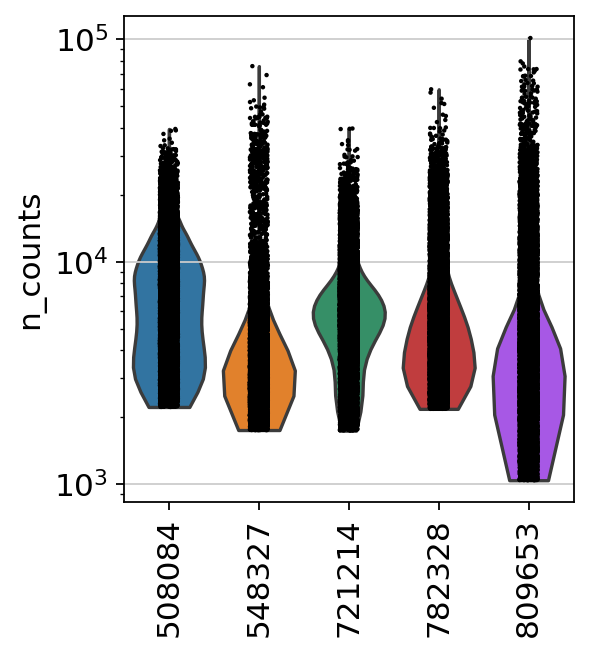

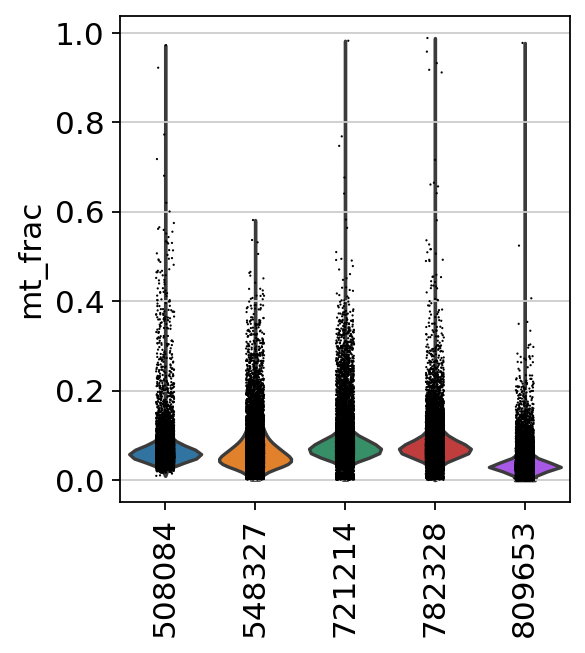

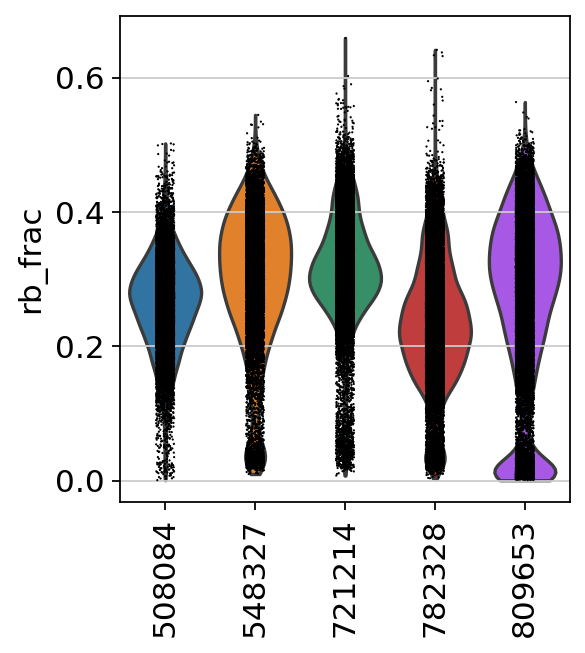

In [57]:
# Sample quality plots

t1 = sc.pl.violin(adata, 'n_counts', groupby='study', size=2, rotation=90,log=True, cut=0)
t2 = sc.pl.violin(adata, 'mt_frac', groupby='study', rotation=90)
t2 = sc.pl.violin(adata, 'rb_frac', groupby='study', rotation=90)

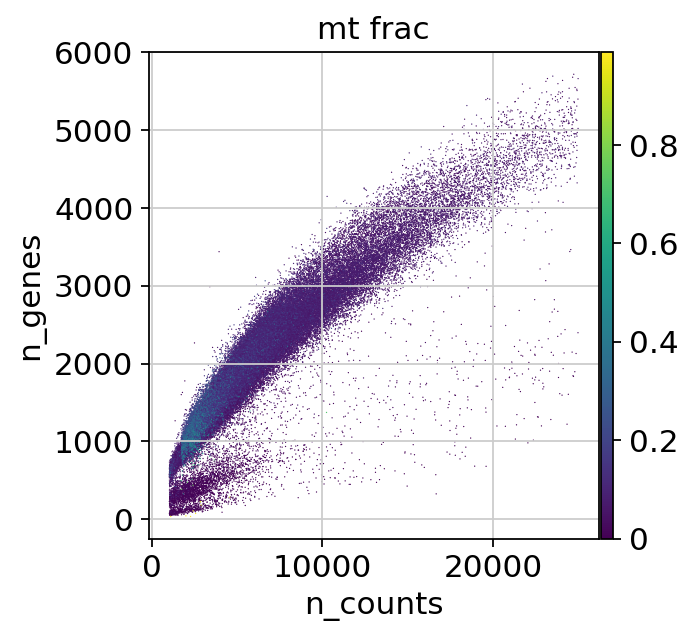

In [58]:
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<25000], 'n_counts', 'n_genes', color='mt_frac')

In [59]:
# FILTER PARAMETERS
print('Total number of cells: {:d}'.format(adata.n_obs))

#Filter out cells with less than 10 expressed genes
sc.pp.filter_cells(adata, min_genes = 10)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

#Filter out cells with over 10% mito fraction
adata = adata[adata.obs['mt_frac'] < 0.1]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

#Filter out cells with over 50% ribo fraction
adata = adata[adata.obs['rb_frac'] < 0.5]
print('Number of cells after Ribo filter: {:d}'.format(adata.n_obs))

Total number of cells: 89827
Number of cells after min genes filter: 89827
Number of cells after MT filter: 78544
Number of cells after Ribo filter: 78364


In [60]:
# Min 3 cells - filters out 0 count genes

print('Total number of genes: {:d}'.format(adata.n_vars))
sc.pp.filter_genes(adata, min_cells=3)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 33694


/home/moritz.thomas/.local/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


Number of genes after cell filter: 24673


In [61]:
goi=['CSF1R','CD86','CD33','IL3RA']
np.isin(goi, adata.var.index)

array([ True,  True,  True,  True])

In [62]:
adata

AnnData object with n_obs × n_vars = 78364 × 24673
    obs: 'study', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'rb_frac'
    var: 'gene_id', 'n_cells'
    uns: 'study_colors'

In [63]:
#Keep the non-normalized count data in a counts layer
adata.layers["counts"] = adata.X.copy()

In [64]:
#Store full dataset in 'raw'
adata.raw = adata

In [65]:
print(np.min(adata.X))
print(np.max(adata.X))

0.0
27586.0


In [66]:
sc.pp.normalize_total(adata, target_sum=10000)

In [67]:
sc.pp.log1p(adata)

In [68]:
print(np.min(adata.X))
print(np.max(adata.X))

0.0
9.005799


In [69]:
# extract highly variable genes
sc.pp.filter_genes_dispersion(adata, flavor='cell_ranger', 
                              n_top_genes=4000, log=False, subset=False)

In [70]:
# Calculate the visualizations
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

sc.tl.umap(adata)
sc.tl.tsne(adata)

2022-08-09 15:17:50.853075: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/R/lib/R/lib


In [75]:
# save adata
adata.write(writepath + 'input_scanvi.h5ad')

In [99]:
adata_query=adata.copy()

In [107]:
adata_query.X=adata_query.layers['counts']

In [111]:
del adata_query.var
del adata_query.uns
del adata_query.obsm
del adata_query.varm
del adata_query.layers
del adata_query.obsp

In [113]:
del adata_query.obs['n_counts']
del adata_query.obs['log_counts']
del adata_query.obs['n_genes']
del adata_query.obs['mt_frac']
del adata_query.obs['rb_frac']

In [108]:
print(np.min(adata_query.X))
print(np.max(adata_query.X))

0.0
27586.0


# Mapping and label transfer using scANVI

## scVI training on reference

In [117]:
adata_ref

AnnData object with n_obs × n_vars = 29536 × 17434
    obs: 'condition', 'cell_type', 'study'

In [118]:
adata_query

AnnData object with n_obs × n_vars = 78364 × 24673
    obs: 'study'

In [119]:
scvi.model.SCVI.setup_anndata(adata_ref, batch_key="study")

In [120]:
arches_params = dict(
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
    n_layers=2,
)

In [121]:
vae_ref = scvi.model.SCVI(
    adata_ref,
    **arches_params
)

In [122]:
vae_ref.train()

/home/moritz.thomas/.local/lib/python3.8/site-packages/scvi/model/base/_training_mixin.py:67: UserWarning: max_epochs=271 is less than n_epochs_kl_warmup=400. The max_kl_weight will not be reached during training.
  warnings.warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 271/271: 100%|██████████| 271/271 [2:49:16<00:00, 37.48s/it, loss=3.51e+03, v_num=1]  


In [123]:
adata_ref.obsm["X_scVI"] = vae_ref.get_latent_representation()

In [124]:
sc.pp.neighbors(adata_ref, use_rep="X_scVI")
sc.tl.umap(adata_ref)

In [127]:
vae_ref.save(writepath + '/scVI/', overwrite=True)

## scANVI training on reference

In [137]:
vae_ref_scan = scvi.model.SCANVI.from_scvi_model(
    vae_ref,
    unlabeled_category="Unknown",
    labels_key="cell_type",
)

In [139]:
vae_ref_scan.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                             


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 20/20: 100%|██████████| 20/20 [29:44<00:00, 89.23s/it, loss=3.63e+03, v_num=1]


In [144]:
adata_ref.obsm["X_scANVI"] = vae_ref_scan.get_latent_representation()
sc.pp.neighbors(adata_ref, use_rep="X_scANVI")
sc.tl.leiden(adata_ref)
sc.tl.umap(adata_ref)

In [146]:
vae_ref_scan.save(writepath + '/scANVI/', overwrite=True)

## Query mapping

In [148]:
scvi.model.SCANVI.prepare_query_anndata(adata_query, vae_ref_scan)

INFO     Found 100.0% reference vars in query data.                                          


In [151]:
vae_q = scvi.model.SCANVI.load_query_data(
    adata_query,
    vae_ref_scan,
)

/home/moritz.thomas/.local/lib/python3.8/site-packages/scvi/data/fields/_scanvi.py:89: UserWarning: Missing labels key cell_type. Filling in with unlabeled category Unknown.
  warnings.warn(


In [152]:
vae_q.train(
    max_epochs=100,
    plan_kwargs=dict(weight_decay=0.0),
    check_val_every_n_epoch=10,
)

INFO     Training for 100 epochs.                                                            


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 100/100: 100%|██████████| 100/100 [2:34:13<00:00, 92.53s/it, loss=6.42e+03, v_num=1]


In [155]:
adata_query.obsm["X_scANVI"] = vae_q.get_latent_representation()

In [156]:
adata_query.obs["predictions"] = vae_q.predict()

# Query and reference together

In [192]:
adata_full = adata_query.concatenate(adata_ref)

/home/moritz.thomas/.local/lib/python3.8/site-packages/anndata/_core/merge.py:942: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [193]:
adata_full.obs.batch.cat.rename_categories(["Query", "Reference"], inplace=True)

In [194]:
adata_full.obs['dataset']=adata_full.obs['batch'].copy()
adata_full.rename_categories('dataset', ["Petti", "VanGalen"])

In [195]:
adata_full.obs

,study,_scvi_batch,_scvi_labels,cell_type,predictions,condition,leiden,batch,dataset
AAACCTGAGAAACGCC-1-508084-508084-0,508084,15,21,Unknown,GMP-like,NaN,NaN,Query,Petti
AAACCTGAGAGTGAGA-1-508084-508084-0,508084,15,21,Unknown,Prog-like,NaN,NaN,Query,Petti
AAACCTGAGTCGATAA-1-508084-508084-0,508084,15,21,Unknown,cDC-like,NaN,NaN,Query,Petti
AAACCTGAGTGCGTGA-1-508084-508084-0,508084,15,21,Unknown,GMP-like,NaN,NaN,Query,Petti
AAACCTGCACCACCAG-1-508084-508084-0,508084,15,21,Unknown,Prog-like,NaN,NaN,Query,Petti
...,...,...,...,...,...,...,...,...,...
AML997-D35_AAATGATCTAGG-1,AML997,13,6,Mono,NaN,unclear,13,Reference,VanGalen
AML997-D35_CGCCTGACCGTA-1,AML997,13,1,CTL,NaN,normal,4,Reference,VanGalen
AML997-D35_CTAGCCTGGAAG-1,AML997,13,19,lateEry,NaN,normal,13,Reference,VanGalen
AML997-D35_GTTGGTGCCCAT-1,AML997,13,19,lateEry,NaN,normal,13,Reference,VanGalen


In [196]:
full_predictions = vae_q.predict(adata_full)
print("Acc: {}".format(np.mean(full_predictions == adata_full.obs.cell_type)))

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       
Acc: 0.1872289156626506


In [197]:
adata_full.obs["predictions"] = full_predictions

In [199]:
del adata_full.obs['_scvi_batch']
del adata_full.obs['_scvi_labels']
del adata_full.obs['leiden']

In [207]:
sc.pp.neighbors(adata_full, use_rep="X_scANVI")
sc.tl.umap(adata_full)
sc.tl.tsne(adata_full, use_rep='X_scANVI')

In [216]:
# reorder categories for UMAP
adata_full.obs['cell_type'].cat.reorder_categories(['T','CTL','NK','HSC','Prog','GMP','ProMono','earlyEry','ProB',
                                                  'Mono','B','cDC','pDC','lateEry', 'Plasma',
                                                  'HSC-like','Prog-like','GMP-like','ProMono-like','Mono-like','cDC-like',
                                                   'Unknown'],
                                                   inplace=True)

In [218]:
adata_full.obs['cell_type'].cat.categories

Index(['T', 'CTL', 'NK', 'HSC', 'Prog', 'GMP', 'ProMono', 'earlyEry', 'ProB',
       'Mono', 'B', 'cDC', 'pDC', 'lateEry', 'Plasma', 'HSC-like', 'Prog-like',
       'GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like', 'Unknown'],
      dtype='object')

In [221]:
adata_full.uns['cell_type_colors']=['#456c35', '#778f51', '#acc38b', 
                                  '#494b64', '#2f1c94','#036fa0', '#80a3db', '#bfb5f5', '#e3e0f3',
                                  '#b58824', '#f9ae17', '#ffd16c', '#cfc94e', '#fffa90', '#fdffcc', 
                                  '#751a2c', '#b31e3c','#b33a3a', '#ab3a18', '#f2744e', '#ed896f',
                                   'lightgrey']

In [659]:
# healthy T-related ('T', 'CTL', 'NK') -> 3 x green
# healthy early ('HSC', 'Prog', 'GMP', 'ProMono','earlyEry','ProB') -> 6 x soft blue
# healthy late ('Mono',  'B','cDC', 'pDC',  'lateEry', 'Plasma') -> 6 x soft yellow
# 6 malignant ('HSC-like', 'Prog-like','GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like') -> 6 x soft red

In [228]:
adata_full.obs['predictions'].cat.categories

Index(['B', 'CTL', 'GMP', 'GMP-like', 'HSC', 'HSC-like', 'Mono', 'Mono-like',
       'NK', 'Plasma', 'ProMono', 'ProMono-like', 'Prog', 'Prog-like', 'T',
       'cDC', 'cDC-like', 'earlyEry', 'lateEry', 'pDC'],
      dtype='object')

In [229]:
# reorder categories for UMAP
adata_full.obs['predictions'].cat.reorder_categories(['T','CTL','NK','HSC','Prog','GMP','ProMono','earlyEry',
                                                  'Mono','B','cDC','pDC','lateEry', 'Plasma',
                                                  'HSC-like','Prog-like','GMP-like','ProMono-like','Mono-like','cDC-like'],
                                                   inplace=True)

In [233]:
adata_full.uns['predictions_colors']=['#456c35', '#778f51', '#acc38b', 
                                  '#494b64', '#2f1c94','#036fa0', '#80a3db', '#bfb5f5',
                                  '#b58824', '#f9ae17', '#ffd16c', '#cfc94e', '#fffa90', '#fdffcc', 
                                  '#751a2c', '#b31e3c','#b33a3a', '#ab3a18', '#f2744e', '#ed896f']

In [231]:
sc.set_figure_params(vector_friendly=True, color_map='Reds',
                     dpi=200,transparent=True, fontsize=14)

In [259]:
# merge predictions and cell_type manually
df1=pd.DataFrame()
df1['fin']=adata_full.obs['predictions'][:adata_full[adata_full.obs.batch=='Query'].n_obs]

df2=pd.DataFrame()
df2['fin']=adata_full.obs['cell_type'][adata_full[adata_full.obs.batch=='Query'].n_obs:]

df=df1.append(df2)
adata_full.obs['cell_type_final']=df['fin']

In [266]:
# reorder categories for UMAP
adata_full.obs['cell_type_final'].cat.reorder_categories(['T','CTL','NK','HSC','Prog','GMP','ProMono','earlyEry','ProB',
                                                  'Mono','B','cDC','pDC','lateEry', 'Plasma',
                                                  'HSC-like','Prog-like','GMP-like','ProMono-like','Mono-like','cDC-like'],
                                                   inplace=True)

In [267]:
adata_full.obs['cell_type_final'].cat.categories

Index(['T', 'CTL', 'NK', 'HSC', 'Prog', 'GMP', 'ProMono', 'earlyEry', 'ProB',
       'Mono', 'B', 'cDC', 'pDC', 'lateEry', 'Plasma', 'HSC-like', 'Prog-like',
       'GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like'],
      dtype='object')

In [270]:
adata_full.uns['cell_type_final_colors']=['#456c35', '#778f51', '#acc38b', 
                                  '#494b64', '#2f1c94','#036fa0', '#80a3db', '#bfb5f5', '#e3e0f3',
                                  '#b58824', '#f9ae17', '#ffd16c', '#cfc94e', '#fffa90', '#fdffcc', 
                                  '#751a2c', '#b31e3c','#b33a3a', '#ab3a18', '#f2744e', '#ed896f']

In [9]:
sc.set_figure_params(vector_friendly=True, color_map='Reds',
                     dpi=200,dpi_save=300, transparent=True, fontsize=14)

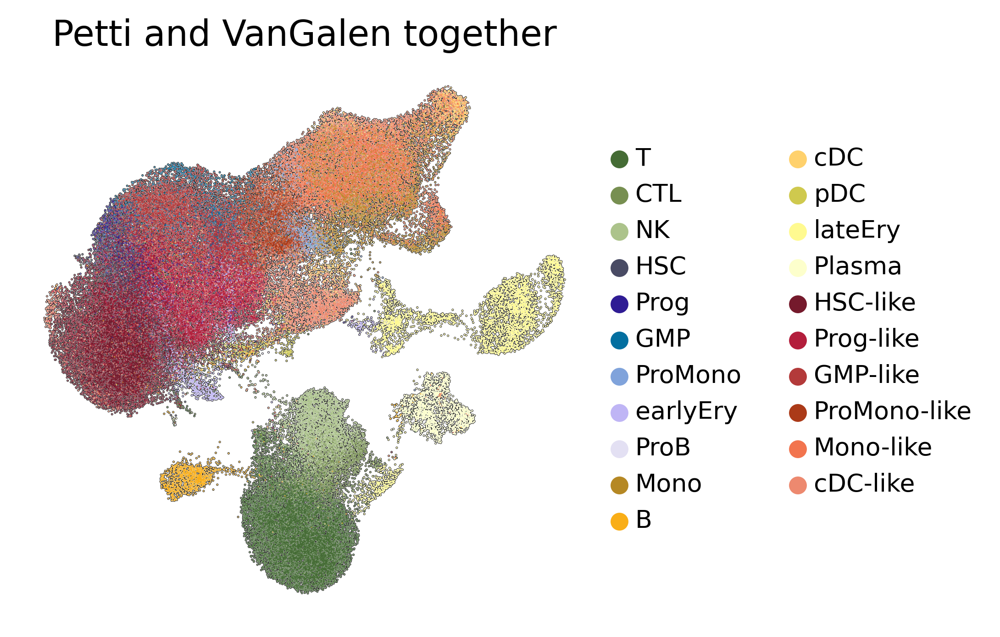

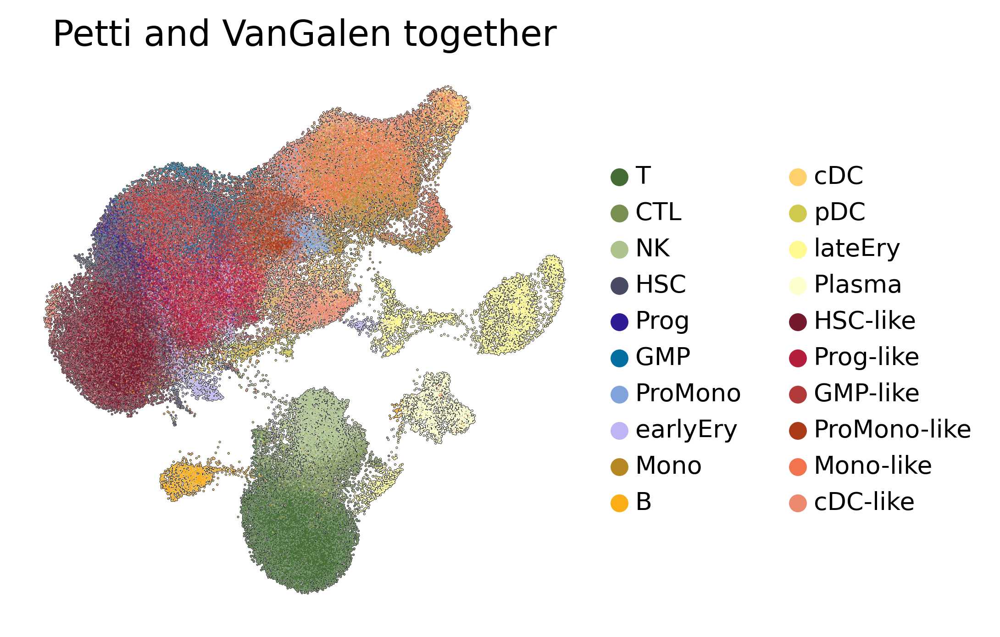

In [331]:
sc.pl.umap(adata_full, color=['cell_type_final'], add_outline=True, use_raw=False, 
           wspace=0.5, legend_fontsize='x-small', title='Petti and VanGalen together',
           frameon=False)

sc.pl.umap(adata_full, color=['predictions'], add_outline=True, use_raw=False, 
           wspace=0.5, legend_fontsize='x-small', title='Petti and VanGalen together',frameon=False)

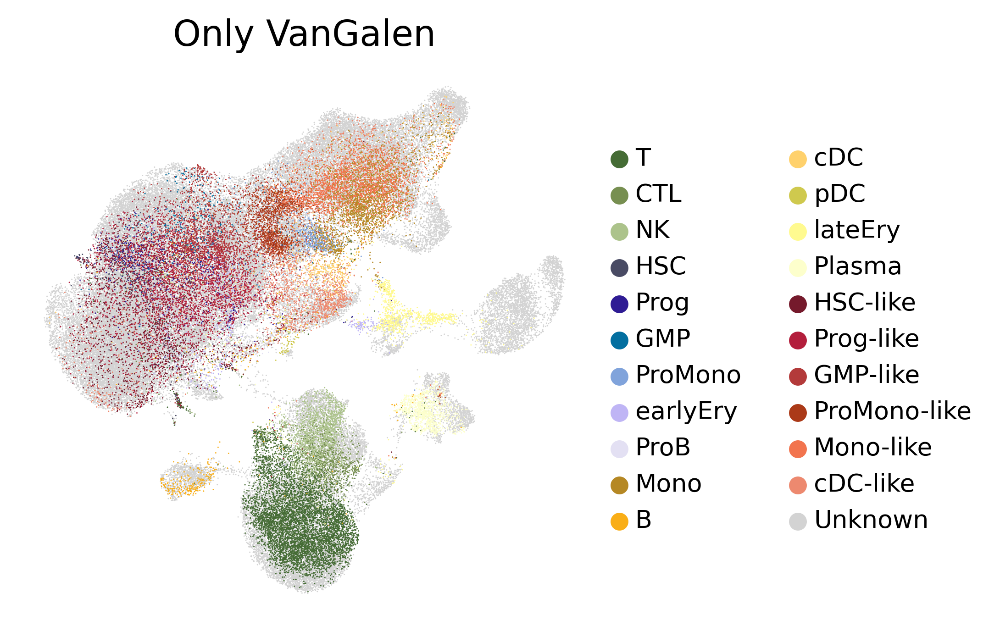

In [342]:
sc.pl.umap(adata_full, color=['cell_type'], add_outline=False, use_raw=False,
           wspace=0.5, legend_fontsize='x-small', title='Only VanGalen',frameon=False)

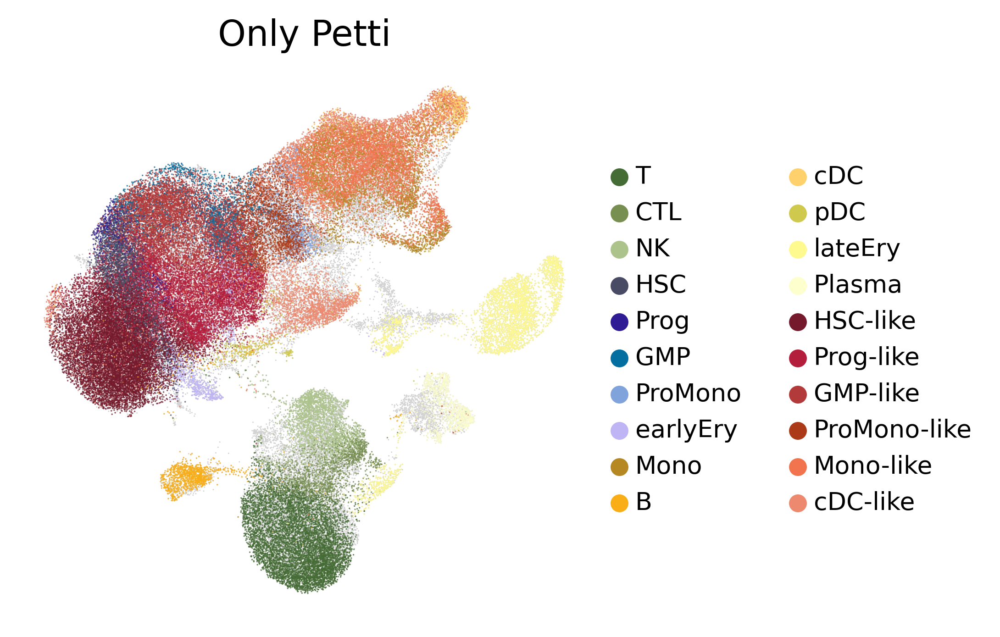

In [334]:
ax = sc.pl.umap(
    adata_full,
    frameon=False,
    show=False,
)
sc.pl.umap(
    adata_full[:adata_query.n_obs],
    color=["predictions"],
    frameon=False,
    legend_fontsize='x-small',
    title="Only Petti",
    ax=ax,
    wspace=0.5,
    alpha=0.7
)

In [280]:
adata_full.uns['study_colors']=['#e3cb9f', '#e8bf74', '#cc9f4b', '#bf861b', '#805504',
                                
                                 '#ede6f5', '#cebfe0', '#af9dc4', '#af90d1', '#9272b5', 
                                '#8661ad', '#6b4691', '#613091', '#5a12a1', '#3f0a73', 
                                '#2d0454', '#1c0236', '#2b1542', '#2b1f38', '#1b181f']

In [285]:
adata_full.uns['dataset_colors']=['#cc9f4b','#5a12a1']

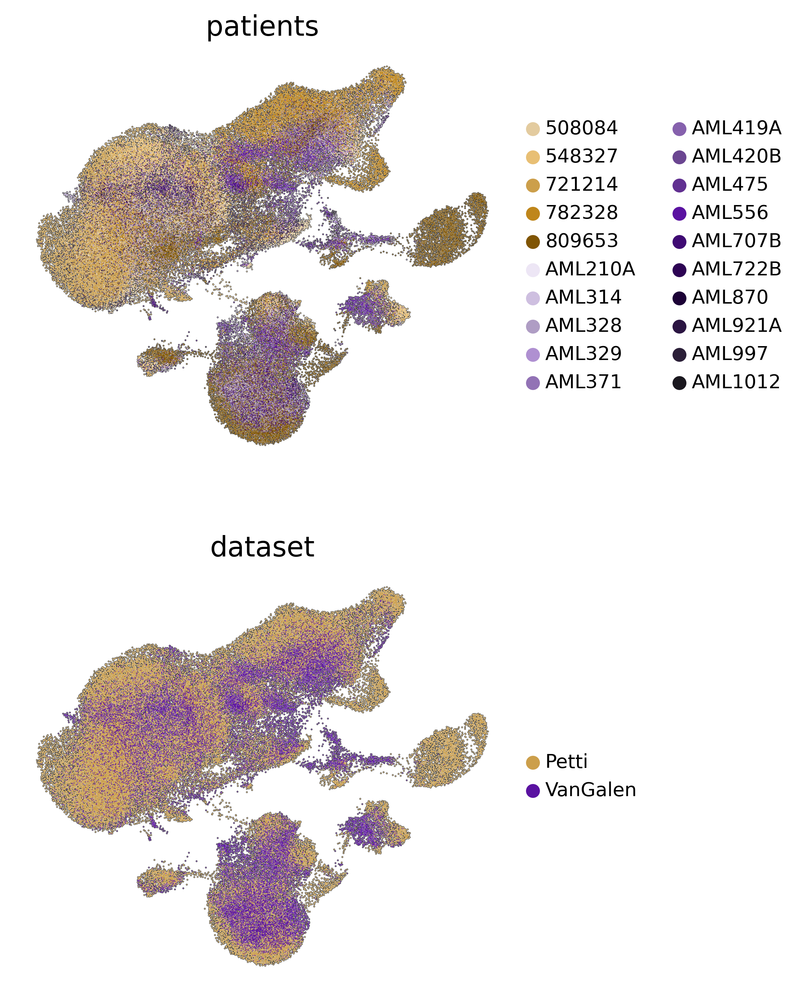

In [335]:
sc.pl.umap(
    adata_full,
    color=["study",'dataset'],add_outline=True,
    frameon=False, legend_fontsize='x-small',
    title=['patients','dataset'],
    ncols=1
)

In [318]:
adata_full

AnnData object with n_obs × n_vars = 107900 × 17434
    obs: 'study', 'cell_type', 'predictions', 'condition', 'batch', 'dataset', 'cell_type_final'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'tsne', 'study_colors', 'dataset_colors', 'predictions_colors', 'cell_type_colors', 'predictions', 'cell_type_final_colors', 'cell_type_final'
    obsm: 'X_scVI', 'X_scANVI', 'X_umap', 'X_tsne'
    obsp: 'distances', 'connectivities'

In [319]:
adata_full.write(writepath + 'scanvi_full.h5ad')

In [6]:
ix=np.isin(adata_full.obs['dataset'],['VanGalen']) 
adata_vg=adata_full[ix].copy()

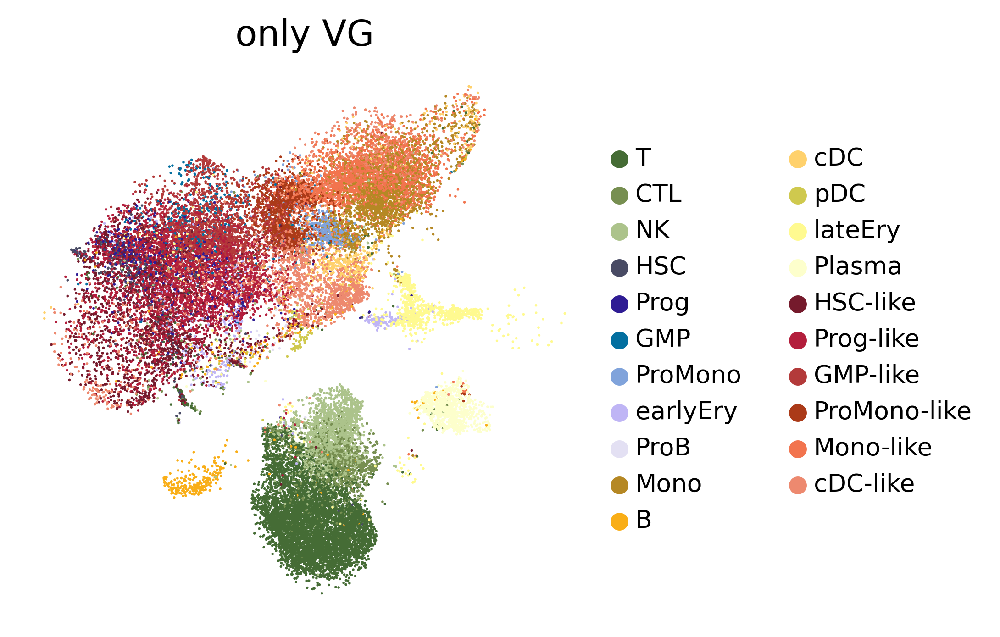

In [341]:
sc.pl.umap(
    adata_vg,
    color=['cell_type_final'],add_outline=False,
    frameon=False, legend_fontsize='x-small',
    title=['only VG'],wspace=0.5,
    ncols=1
)

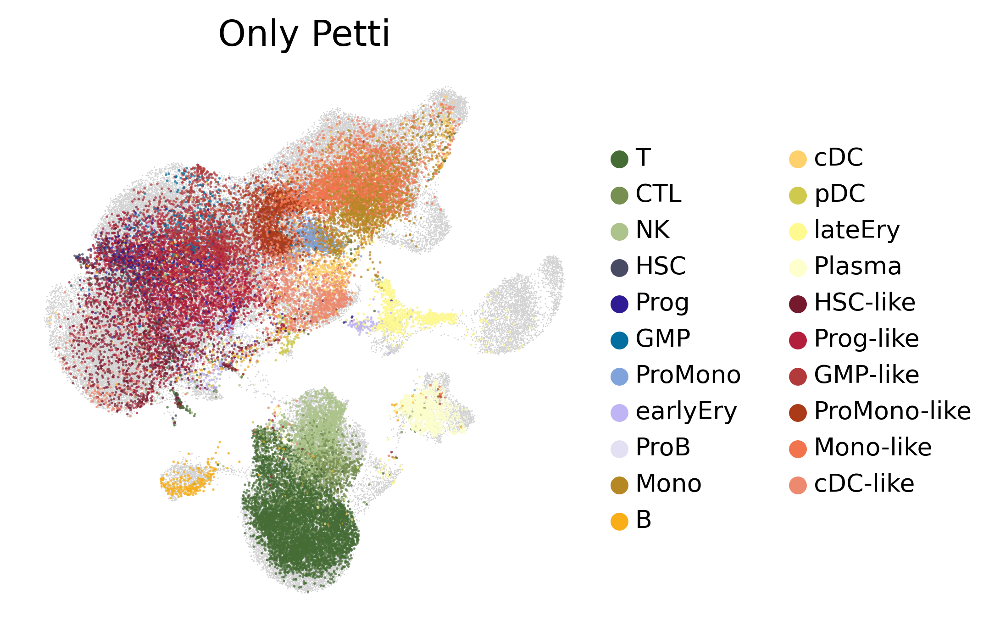

In [337]:
sc.pl.umap(
    adata_vg,
    color=["cell_type_final"],
    frameon=False,
    legend_fontsize='x-small',
    title="Only Petti",
    wspace=0.5,
    alpha=0.7
)